In [1]:
# import large_image
import histomicstk
from histomicstk.saliency import tissue_detection
from histomicstk.preprocessing.color_normalization.\
    deconvolution_based_normalization import deconvolution_based_normalization

In [2]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
from skimage.transform import resize
from tqdm.notebook import tqdm

### Configure path

In [3]:
in_path = "/media/visiopharm5/WDRed(backup)/qupath_masson_trichrome/tiffs_5x_selected"
out_path = "/media/visiopharm5/WDRed(backup)/qupath_masson_trichrome/norm_5x_"

wsi_target = "WT-TCM-1.czi[--series, 0].tiff"

In [4]:
nsrc = []
for root, dirs, tiffs in os.walk(in_path):
    for tiff in tiffs:
#         if tiff != wsi_target:
        nsrc.append(tiff) # include the target slide in the processing to have the same detail level
print(len(nsrc))
print(nsrc)

10
['KI-TCM-1.czi[--series, 1].tiff', 'KI-TCM-2.czi[--series, 0].tiff', 'KI-TCM-3.czi[--series, 0].tiff', 'KI-TCM-4.czi[--series, 0].tiff', 'KI-TCM-5.czi[--series, 0].tiff', 'KI-TCM-6.czi[--series, 0].tiff', 'WT-TCM-1.czi[--series, 0].tiff', 'WT-TCM-2.czi[--series, 1].tiff', 'WT-TCM-3.czi[--series, 1].tiff', 'WT-TCM-4.czi[--series, 0].tiff']


### Functions

In [5]:
def read_image(name):
    """ 
    Load TIFF image and display the thumbnail.
    Return: numpy array
    """
    im = Image.open(os.path.join(in_path, name))
    
    thumb = im.copy()
    thumb.thumbnail((512,512))
    display(thumb)
    
    im = np.array(im)
    
    im.setflags(write=1)
#     print(im.flags)
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            if sum(im[i,j,:]) == 0:
                im[i,j,:] = [255, 255, 255] # black pixels will be detected as tissue, so replace with white (detected as bgr) 
    im.setflags(write=0)
    
    print(im.shape)
    return im, thumb

In [6]:
# Generate mask
def generate_mask(im_src):
    labeled, _ = tissue_detection.get_tissue_mask(
        im_src, deconvolve_first=False,
        n_thresholding_steps=1, sigma=0.0, min_size=0) # deconvolve_first=True
    
    mask_out = resize(
        labeled == 0, output_shape=np.array(im_src).shape[:2],
        order=0, preserve_range=True) == 1

#     f, ax = plt.subplots(1, 2, figsize=(15, 15))
#     ax[0].imshow(im_src)
# #     ax[1].imshow(labeled) # all tissue regions
#     ax[1].imshow(mask_out) # for normalization
#     plt.show()
    
#     print(mask_out)

    return(mask_out)

In [7]:
# 1-step color normalization (whole slide normalization, eg. 2.5x for zeiss)
def color_nor(method, im_target, im_src, src_mask=False, targ_mask=False):
    
    if targ_mask:
        targ_mask = generate_mask(im_target)
    else:
        targ_mask = None
#         f, ax = plt.subplots(1, 1, figsize=(15, 15))
#         ax.imshow(im_target)
#         plt.show()
    
    if method == "reinhard":
        target_mean, target_std = histomicstk.preprocessing.color_conversion.lab_mean_std(
            im_target, mask_out=targ_mask)
        
        if src_mask:
            src_mask = generate_mask(im_src)
            im_normalized = histomicstk.preprocessing.color_normalization.reinhard(
                im_src, target_mu=target_mean, target_sigma=target_std, mask_out=src_mask)
            f, ax = plt.subplots(1, 4, figsize=(15, 15))
            ax[0].imshow(im_target)
            ax[1].imshow(im_src)
            ax[2].imshow(src_mask)
            ax[3].imshow(im_normalized)
            plt.show()
        else:
            im_normalized = histomicstk.preprocessing.color_normalization.reinhard(
                im_src, target_mu=target_mean, target_sigma=target_std)
            f, ax = plt.subplots(1, 3, figsize=(15, 15))
            ax[0].imshow(im_target)
            ax[1].imshow(im_src)
            ax[2].imshow(im_normalized)
            plt.show()
            
            
    """
    I found that HistomicsTK can not use deconvolution-based method on Masson trichrome images.
    For Macenko (pca), it is necessary to re-order the deconvoluted channels.
    However, it only support 2-color staining. The third channel will be fed with the cross product of the first 2 channels.
    For SNMF, mask of target image is not supported.
    Can be solved by long processing time.
    However still no solution for 3-color stainning.
    """
#     elif method.startswith("deconv"):
# #         f, ax = plt.subplots(1, 1, figsize=(15, 15))
# #         ax.imshow(im_target)
# #         plt.show()

#         if method == "deconv_snmf":
#         # Sparse non-negative matrix factorization
#         # Note: Masking is not yet implemented in xu_snmf.
        
# #             # Compute stain matrix adaptively
# #             sparsity_factor = 0.5

# #             I_0 = 255
# #             W_est = histomicstk.preprocessing.color_deconvolution.rgb_separate_stains_xu_snmf(
# #                 im_rgb = im_target, I_0 = I_0, beta = sparsity_factor)

#         # super long to compute the W_est, 3h! So here we load the pre-computed matrix
#             W_est = np.array([[0.38817029, 0.58817332, 0.85582258], [0.7970659 , 0.4003041 , 0.49011613], 
#                               [0.46261191, 0.70271528, 0.16539009]])
        
#             stain_unmixing_routine_params = {
#                 'stains': ['hematoxylin', 'eosin'],
#                 'stain_unmixing_method': 'xu_snmf'}
        
#             """ not yet finished
#             if src_mask:
#                 im_normalized = deconvolution_based_normalization(
#                     im_src, W_target=W_est, mask_out=src_mask,
#                     stain_unmixing_routine_params=stain_unmixing_routine_params)
#             """
            
#         elif method == "deconv_macenko_pca":
#         # reorder channels in W_target and W_source is a necessary step in macenko's method
        
#             stain_unmixing_routine_params = {
#                 'stain_unmixing_method': 'macenko_pca'}
        
        
#         """ not yet finished
#         if src_mask:
#             im_normalized = deconvolution_based_normalization(
#                 im_src, im_target=im_target,
#                 stain_unmixing_routine_params=stain_unmixing_routine_params,
#                 mask_out=src_mask)

#             f, ax = plt.subplots(1, 4, figsize=(15, 15))
#             ax[0].imshow(im_target)
#             ax[1].imshow(im_src)
#             ax[2].imshow(src_mask)
#             ax[3].imshow(im_normalized)
#             plt.show()
            
#         else:
#             im_normalized = deconvolution_based_normalization(
#                 im_src, im_target=im_target,
#                 stain_unmixing_routine_params=stain_unmixing_routine_params)
#             f, ax = plt.subplots(1, 3, figsize=(15, 15))
            
#             ax[0].imshow(im_src)
#             ax[1].imshow(im_normalized)
#             plt.show()
#         """
        
    return im_normalized

In [8]:
# 2-step color normalzation: 1/2 (for cropping to reduce memory requirement, eg. 5x for zeiss)
def get_meta(im_target, targ_mask=False):
    if targ_mask:
        targ_mask = generate_mask(im_target)
    else:
        targ_mask = None
    
    target_mean, target_std = histomicstk.preprocessing.color_conversion.lab_mean_std(
            im_target, mask_out=targ_mask)
    
    return target_mean, target_std

In [9]:
# 2-step color normalzation: 2/2 (for cropping to reduce memory requirement, eg. 5x for zeiss)
def reinhard_normalize(target_mean, target_std, im_src, src_mask=False):
    if src_mask:
        src_mask = generate_mask(im_src)
        im_normalized = histomicstk.preprocessing.color_normalization.reinhard(
            im_src, target_mu=target_mean, target_sigma=target_std, mask_out=src_mask)
        f, ax = plt.subplots(1, 3, figsize=(15, 15))
        ax[0].imshow(im_src)
        ax[1].imshow(src_mask)
        ax[2].imshow(im_normalized)
        plt.show()
    else:
        im_normalized = histomicstk.preprocessing.color_normalization.reinhard(
            im_src, target_mu=target_mean, target_sigma=target_std)
        f, ax = plt.subplots(1, 2, figsize=(15, 15))
        ax[0].imshow(im_src)
        ax[1].imshow(im_normalized)
        plt.show()
        
    return im_normalized

### Load target image

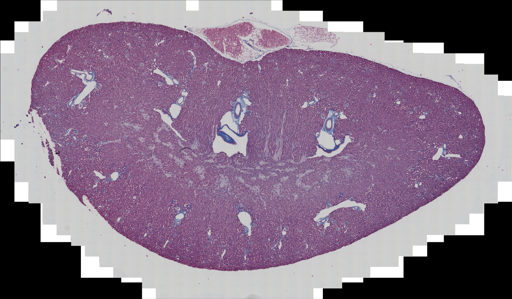

(7592, 13000, 3)


In [10]:
im_target, thumb_target = read_image(wsi_target)
del(thumb_target)

### Solution 1: Crop 5x slides and normalize

In [11]:
target_mean, target_std = get_meta(im_target, targ_mask=True)
del(im_target)

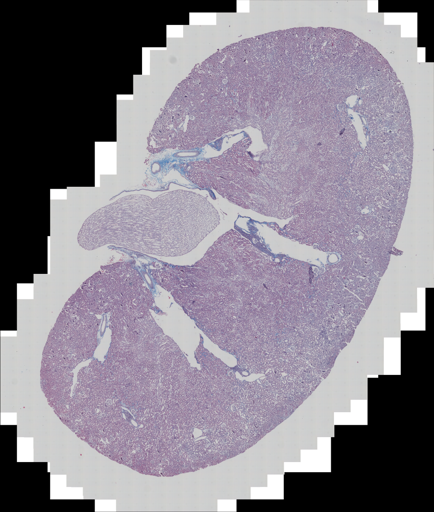

(11104, 9408, 3)


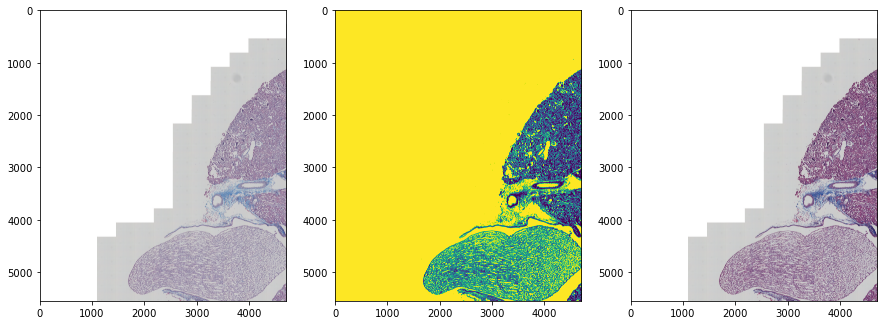

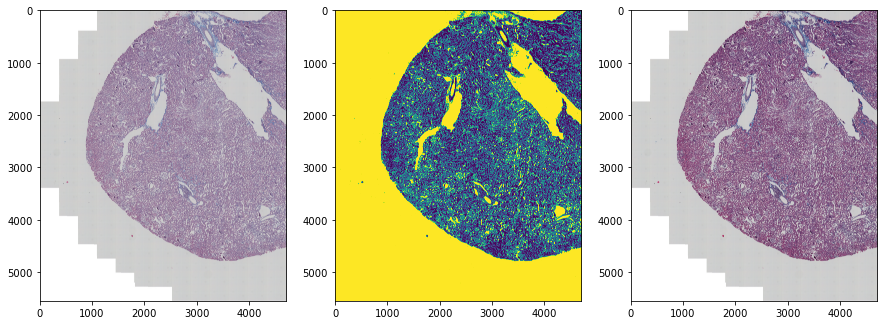

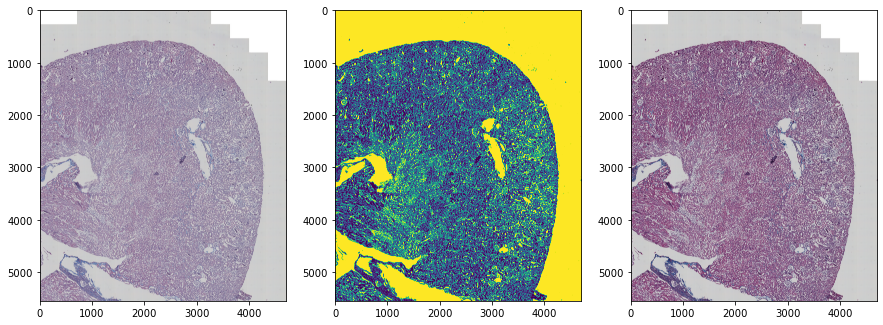

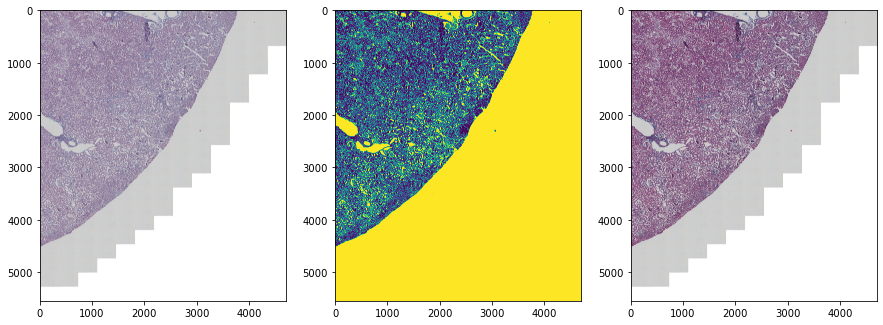

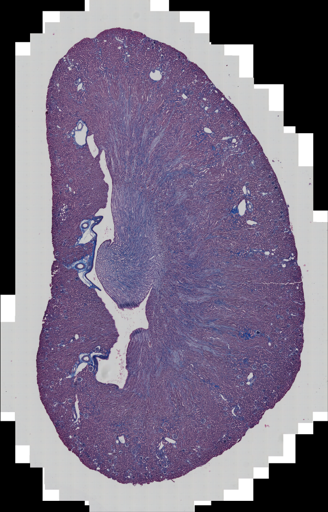

(12451, 7969, 3)


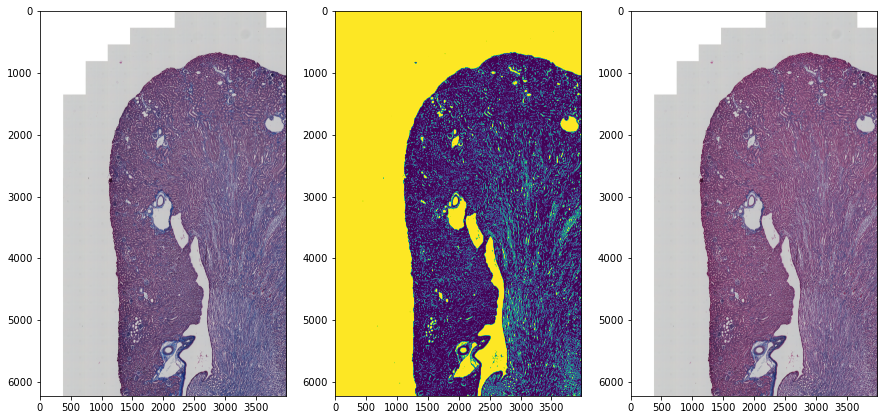

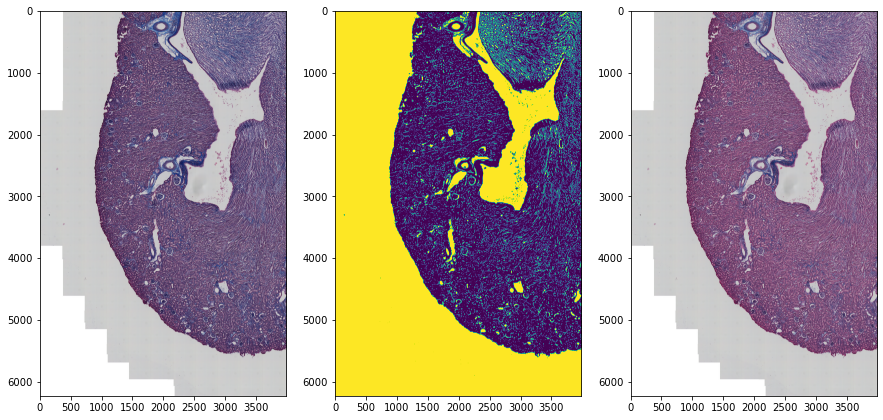

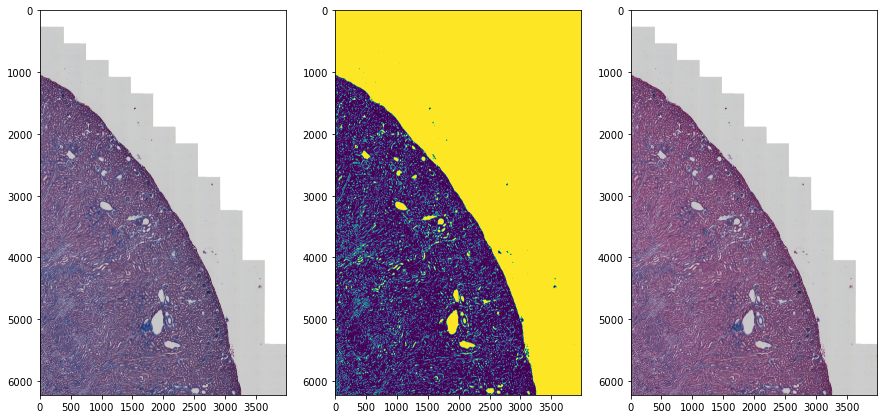

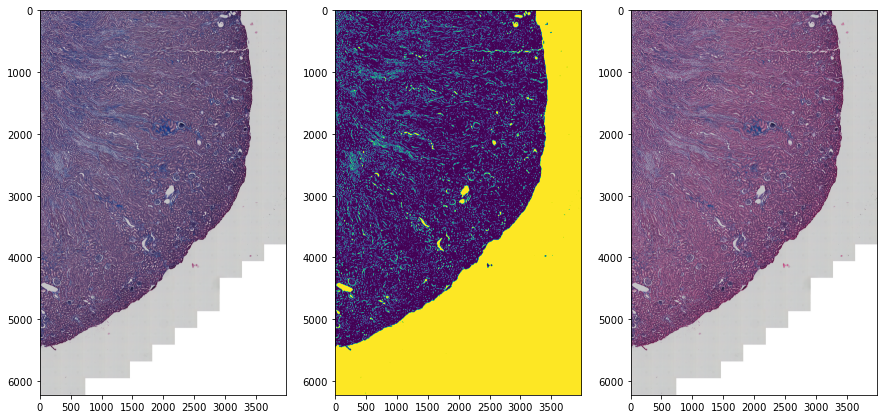

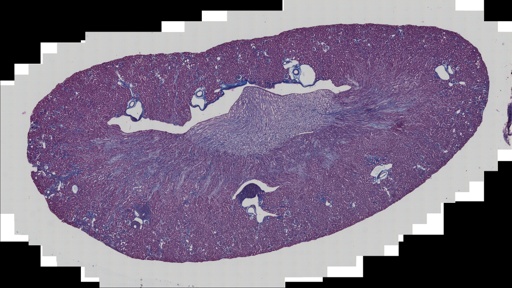

(7325, 13005, 3)


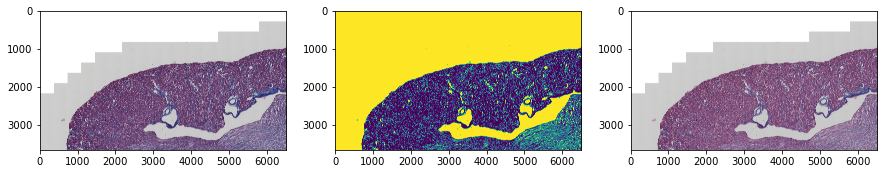

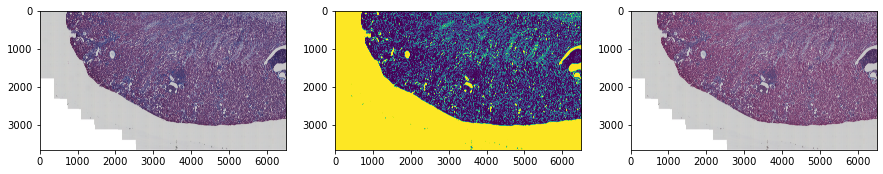

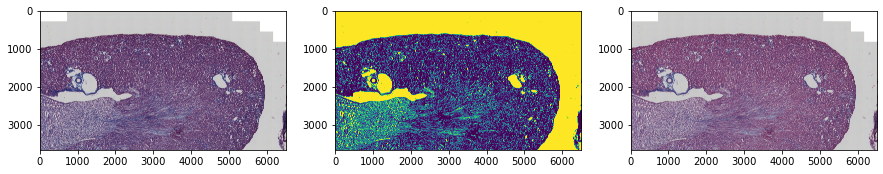

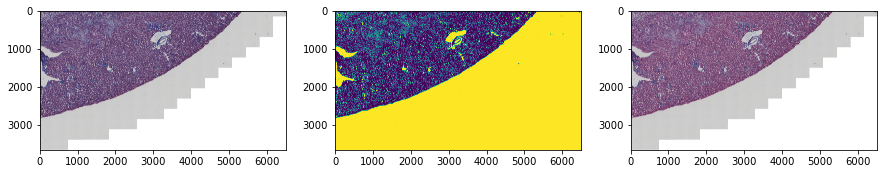

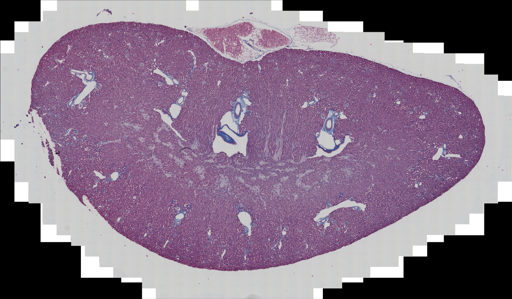

(7592, 13000, 3)


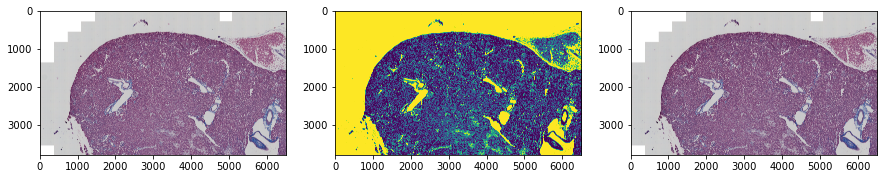

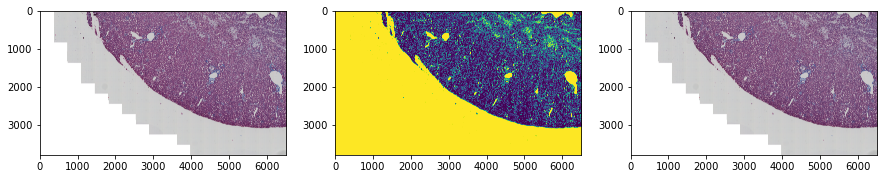

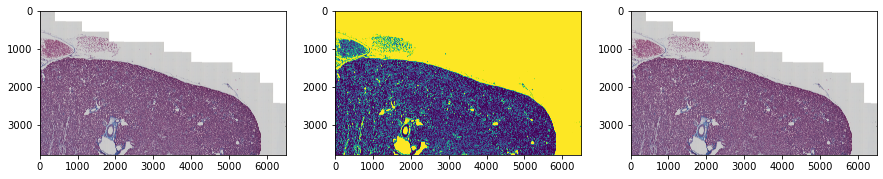

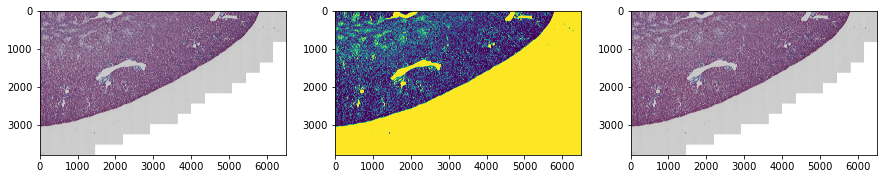

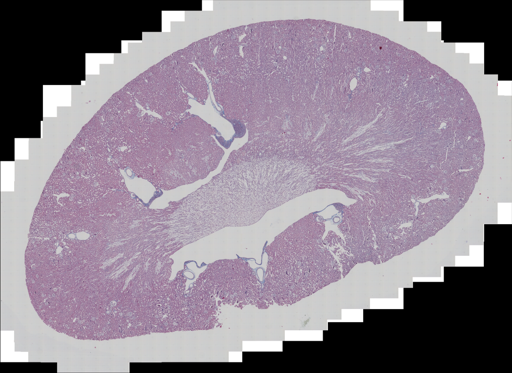

(9487, 13006, 3)


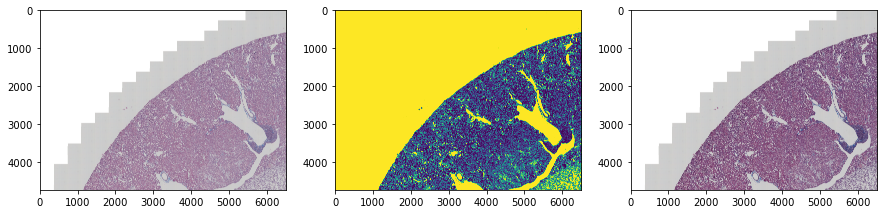

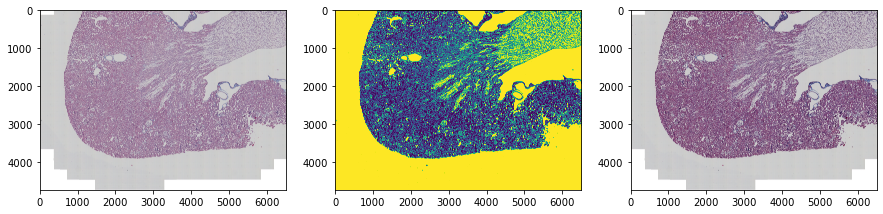

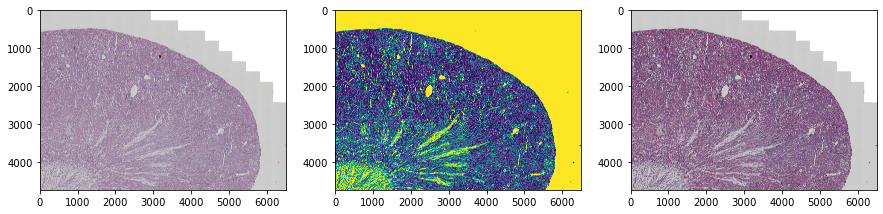

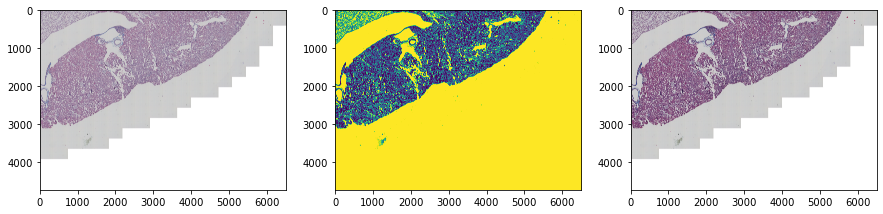

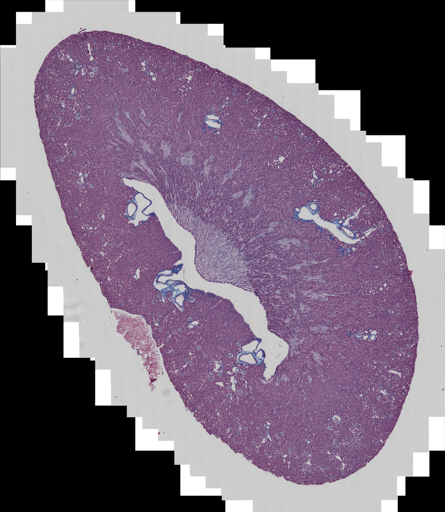

(11635, 10119, 3)


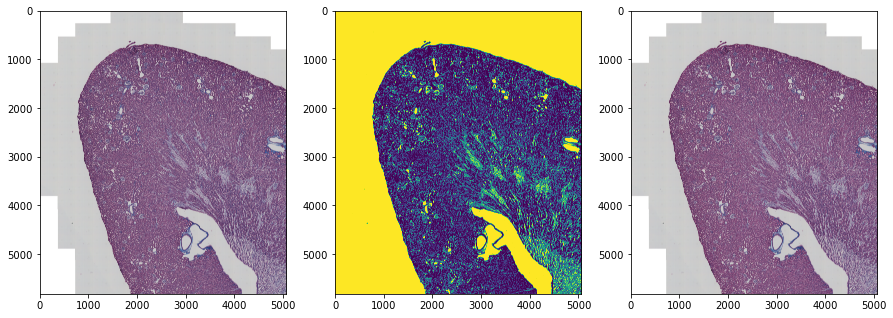

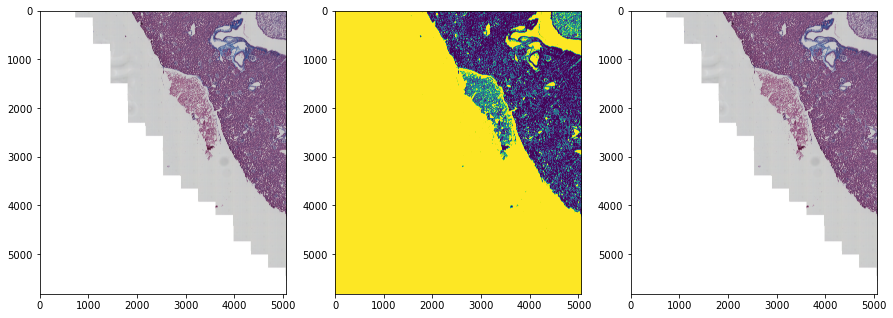

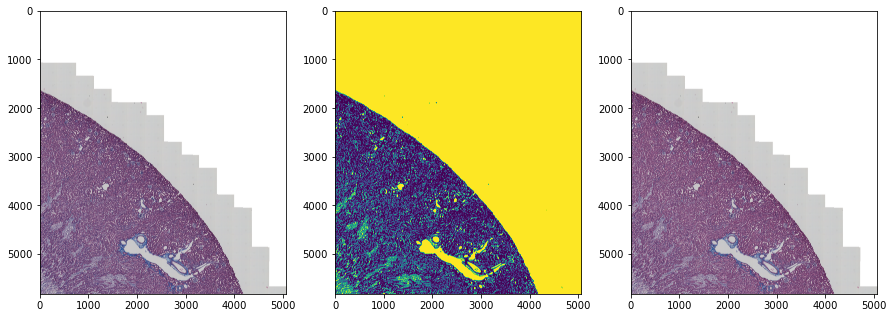

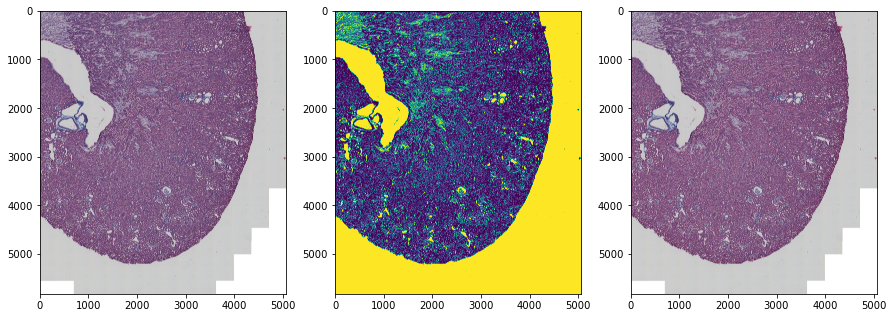

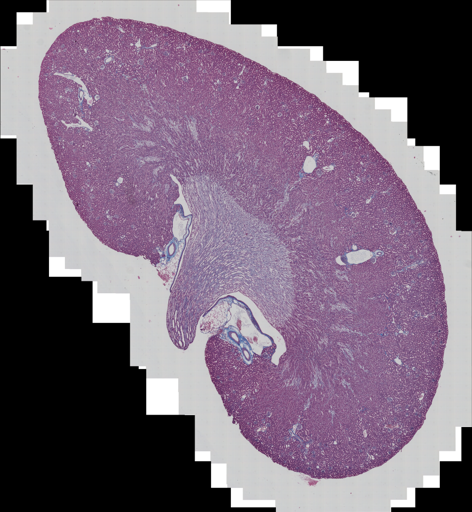

(11369, 10484, 3)


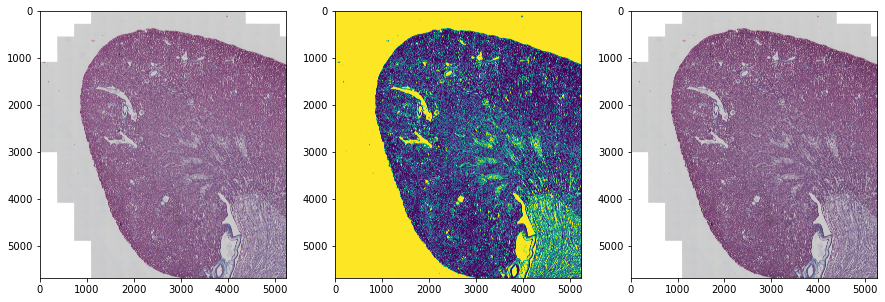

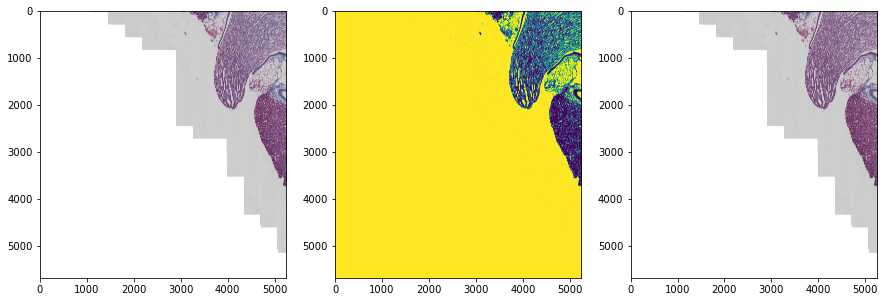

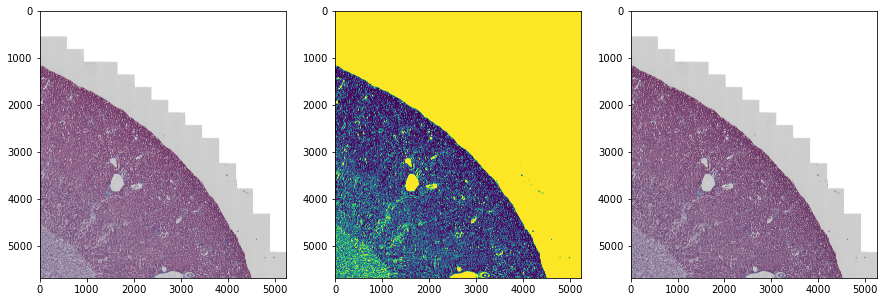

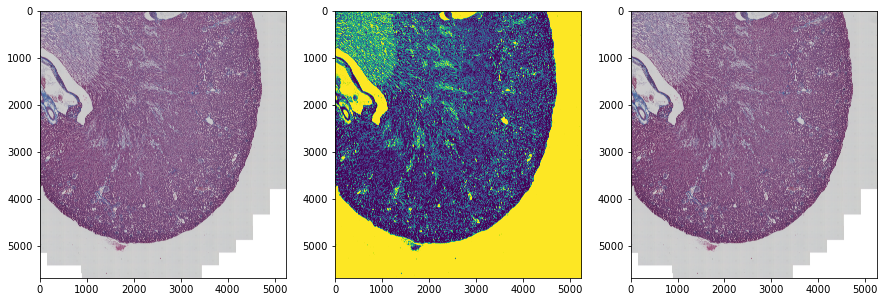

In [12]:
for src in tqdm(nsrc[3:]):
    im_src, thumb_src = read_image(src)
    del(thumb_src)

    im_src0 = im_src[:im_src.shape[0]//2, : im_src.shape[1]//2]
    im_src1 = im_src[im_src.shape[0]//2 : im_src.shape[0], : im_src.shape[1]//2]
    im_src2 = im_src[:im_src.shape[0]//2, im_src.shape[1]//2 : im_src.shape[1]]
    im_src3 = im_src[im_src.shape[0]//2 : im_src.shape[0], 
                     im_src.shape[1]//2 : im_src.shape[1]]
    del(im_src)
    im_src0 = reinhard_normalize(target_mean, target_std, im_src0, src_mask=True)
    im_src1 = reinhard_normalize(target_mean, target_std, im_src1, src_mask=True)
    im_src2 = reinhard_normalize(target_mean, target_std, im_src2, src_mask=True)
    im_src3 = reinhard_normalize(target_mean, target_std, im_src3, src_mask=True)

    Image.fromarray(np.hstack((np.vstack((im_src0, im_src1)), np.vstack((im_src2, im_src3))))).save(os.path.join(out_path, re.split(".t", src)[0]+"_reinhard_stmask.tiff"))
    del(im_src0, im_src1, im_src2, im_src3)

In [ ]:
# Correct exception: n
src = nsrc[-3]
print(src)

In [ ]:
im_src, thumb_src = read_image(src)
del(thumb_src)

im_src0 = im_src[:im_src.shape[0]//2, : im_src.shape[1]//2]
im_src1 = im_src[im_src.shape[0]//2 : im_src.shape[0], : im_src.shape[1]//2]
im_src2 = im_src[:im_src.shape[0]//2, im_src.shape[1]//2 : im_src.shape[1]]
im_src3 = im_src[im_src.shape[0]//2 : im_src.shape[0], 
                 im_src.shape[1]//2 : im_src.shape[1]]
del(im_src)

src_mask, _ = tissue_detection.get_tissue_mask(
    im_src0, deconvolve_first=False,
    n_thresholding_steps=1, sigma=0., min_size=3)
del(_)

src_mask = resize(
    src_mask == 0, output_shape=np.array(im_src0).shape[:2],
    order=0, preserve_range=True) == 1

im_normalized = histomicstk.preprocessing.color_normalization.reinhard(
    im_src0, target_mu=target_mean, target_sigma=target_std, mask_out=src_mask)
f, ax = plt.subplots(1, 3, figsize=(15, 15))
ax[0].imshow(im_src0)
ax[1].imshow(src_mask)
ax[2].imshow(im_normalized)
plt.show()
del(im_src0, src_mask)

im_src1 = reinhard_normalize(target_mean, target_std, im_src1, src_mask=True)
im_src2 = reinhard_normalize(target_mean, target_std, im_src2, src_mask=True)
im_src3 = reinhard_normalize(target_mean, target_std, im_src3, src_mask=True)

Image.fromarray(np.hstack((np.vstack((im_normalized, im_src1)), np.vstack((im_src2, im_src3))))).save(os.path.join(out_path, re.split(".t", src)[0]+"_reinhard_stmask.tiff"))
del(im_normalized, im_src1, im_src2, im_src3)

### Solution 2: Normalize 2.5x whole slide

In [ ]:
# Reinhard's method works the best with target mask and source mask
for src in tqdm(nsrc):
    im_src, thumb_src = read_image(src)
    del(thumb_src)
    
#     im_src_reinhard = color_nor("reinhard", im_target, im_src)
#     Image.fromarray(im_src_reinhard).save(os.path.join(
#         out_path, re.split(".t", src)[0]+"_reinhard.tiff"))
#     del(im_src_reinhard)
    
#     im_src_reinhard_smask = color_nor("reinhard", im_target, im_src, src_mask=True)
#     Image.fromarray(im_src_reinhard_smask).save(os.path.join(out_path, re.split(".t", src)[0]+
#                                                              "_reinhard_smask.tiff"))
#     del(im_src_reinhard_smask)
    
#     im_src_reinhard_tmask = color_nor("reinhard", im_target, im_src, targ_mask=True)
#     Image.fromarray(im_src_reinhard_tmask).save(os.path.join(out_path, re.split(".t", src)[0]+
#                                                              "_reinhard_tmask.tiff"))
#     del(im_src_reinhard_tmask)
    
    im_src_reinhard_stmask = color_nor("reinhard", im_target, im_src, src_mask=True, targ_mask=True)
    Image.fromarray(im_src_reinhard_stmask).save(os.path.join(out_path, re.split(".t", src)[0]+
                                                             "_reinhard_stmask.tiff"))
    del(im_src_reinhard_stmask)